# SpectralClustering

In [1]:
import numpy as np
import sys
sys.path.append("..")
from function.function import loadData, show_data, preprocessing, showDistribution, removenans, crossplot, plotResult, plotInputData, output_addNan
from function.function import spectral, sc_param, sc_param_ch, sc_param_sc, sc_param_db, plot_dimensionality_reduction, plot_cluster_distribution
from function.function import calculatef1, calculateAmi, calculateAri, calculateVm

## Load Data

In [2]:
data = np.load('../syntheticData/Model5b/output_fields_smooth.npz')

data_list = loadData(data)


## Plot Input Data

Using function show_data() to draw each parameter of input data. 

There are three parameters of show_data(), which are dataset, the number of rows and the number of columns.

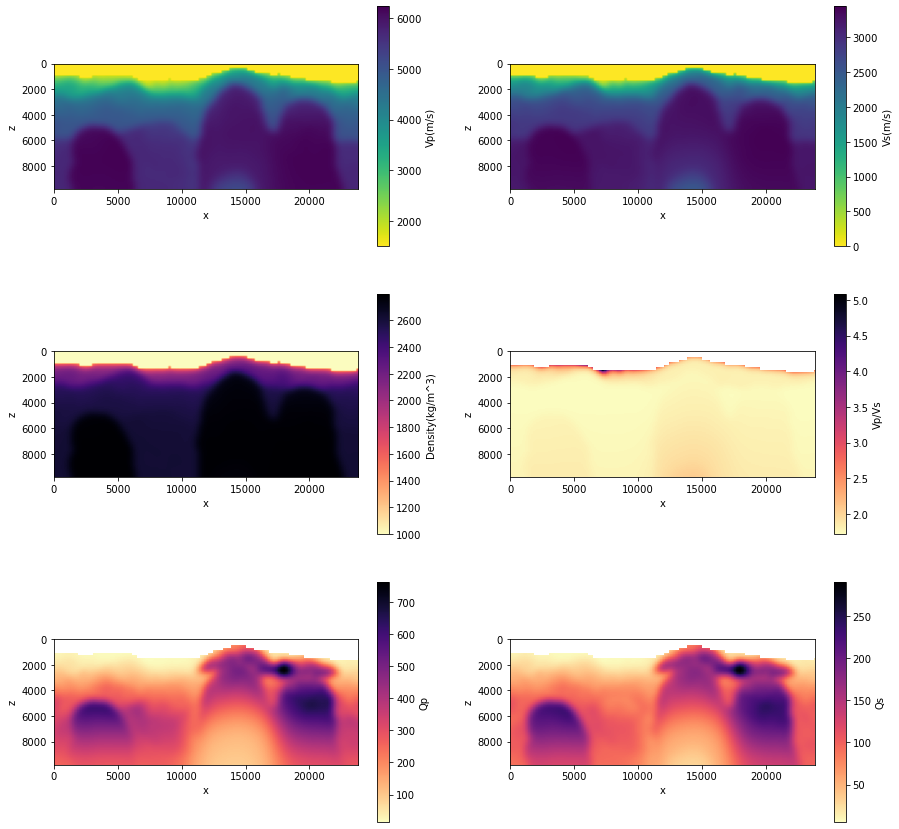

In [3]:
show_data(data_list,3,2)

Using removenans() to remove points with nan values from array. 

- new_data is the original data saved in the form of np.array.

- data_noNan removes nan values from new_data. 

- nan_list is the list of nan values index.

In [4]:
new_data,data_noNan,nan_list = removenans(data)

Using showDistribution() to show the distribution of each parameter. Since the last two parameters of new_data is 'x' and 'z', we only use new_data[:,:-2]

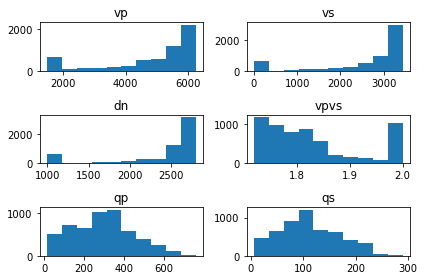

In [5]:
showDistribution(new_data[:,:-2])

Using crossplot to plot the cross-plot (scatter plot) of each pair of physical properties (other parameters and vp)

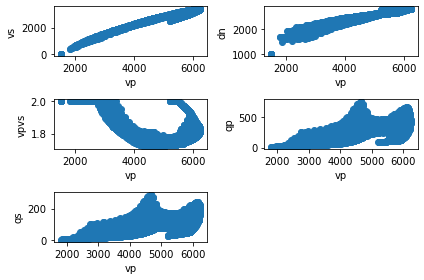

In [6]:
crossplot(new_data)

## Data Preprocessing

Using preprocessing() to make data standardized

In [7]:
# remove the mean
# divide by the variance

data_preprocessing = preprocessing(data_noNan) 


## Plot Data after Preprocessing

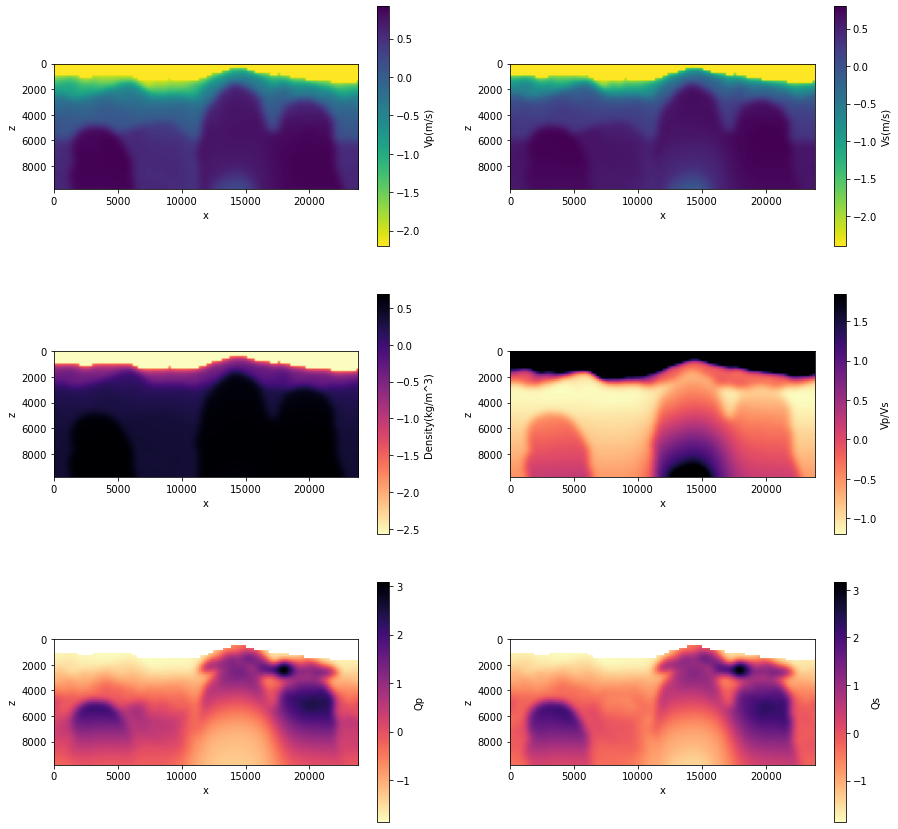

In [8]:
data_list = []
data1 = preprocessing(new_data)
for i in range(data_preprocessing.shape[1]-2):
    data_list.append(data1[:,i].reshape(50,120))
show_data(data_list,3,2)

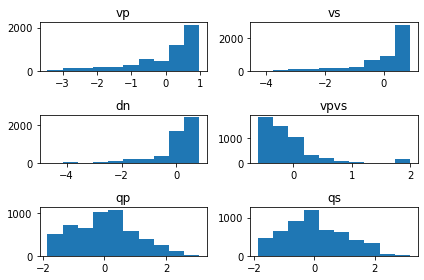

In [9]:
showDistribution(data_preprocessing[:,:-2])

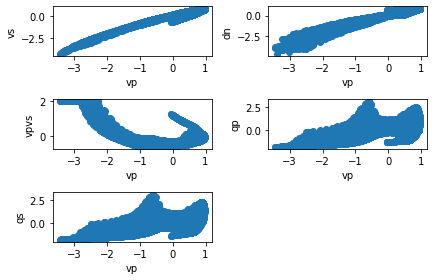

In [10]:
crossplot(data_preprocessing)

## SpectralClustering

Using spectral() to divide data in clusters.

- result_sc is the result of SpectralClustering and data_preprocessing is normalized data without nan values

Using plotResult() to show the result of clusters.

- data_noNan removes nan values from original data
- result_sc is labels for data without nan values after SpectralClustering

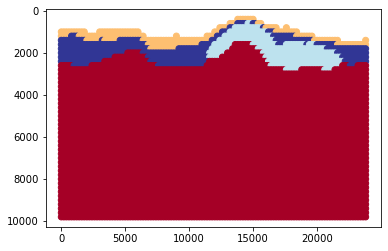

In [11]:
result_sc = spectral(4,data_preprocessing[:,:-2])
plotResult(data_noNan,result_sc)

## Tuning Parameters

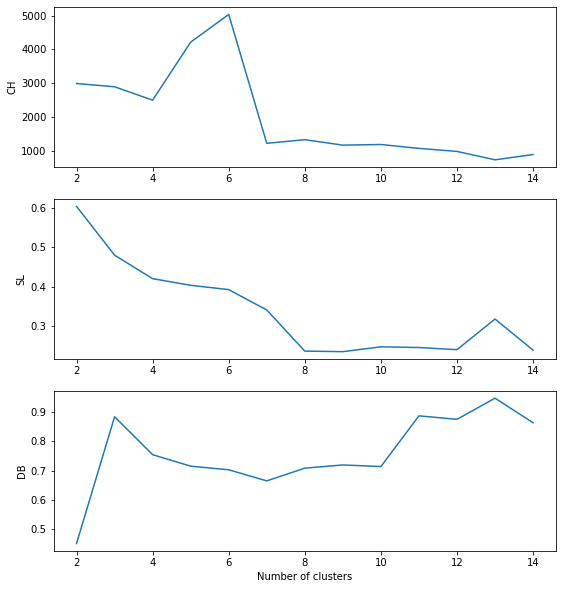

In [12]:
sc_param(data_preprocessing[:,:-2])

## Input Data

Loading and plotting input data.

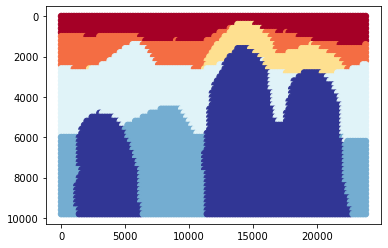

In [13]:
input_data = np.load('../syntheticData/Model5b/input_fields.npz')
plotInputData(input_data)

In [14]:
input_label = input_data['classes'].reshape(-1)

## Validation

### Calinsky-Harabasz score

In [15]:
sc_param_ch(data_preprocessing[:,:-2])

{'the best number of cluster': 6 }


In [16]:
result_sc = spectral(6, data_preprocessing[:,:-2])
result_sc = output_addNan(result_sc,nan_list)
calculatef1(result_sc, input_data)

F1-score is:  0.0045


### Silhouette score

In [17]:
sc_param_sc(data_preprocessing[:,:-2])

{'the best number of cluster': 2 }


In [18]:
result_sc = spectral(2, data_preprocessing[:,:-2])
result_sc = output_addNan(result_sc,nan_list)
calculatef1(result_sc, input_data)

F1-score is:  0.04533333333333334


### Davies Bouldin score

In [19]:
sc_param_db(data_preprocessing[:,:-2])

{'the best number of cluster': 2 }


In [20]:
result_sc = spectral(2, data_preprocessing[:,:-2])
result_sc = output_addNan(result_sc,nan_list)
calculatef1(result_sc, input_data)

F1-score is:  0.04533333333333334


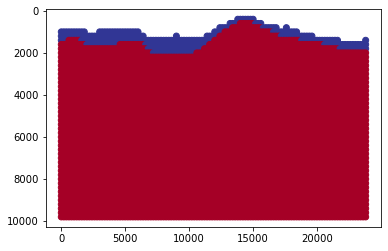

In [21]:
result_sc = spectral(2, data_preprocessing[:,:-2])
plotResult(data_noNan,result_sc)

## Dimensionality Reduction

Using plot_dimensionality_reduction() to plot the cluster result after dimensionality reduction.

It has two parameters:

- The first one is dataset
- The second one is cluster result

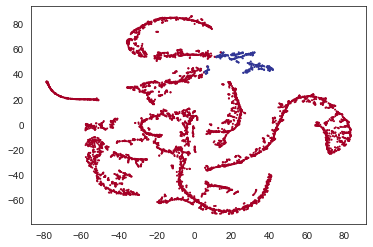

In [22]:
plot_dimensionality_reduction(data_preprocessing[:,:-2],result_sc)

## Cluster Distribution

Using plot_cluster_distribution() to plot the distribution of clusters.

1
[-1.5 -0.5  0.5  1.5]


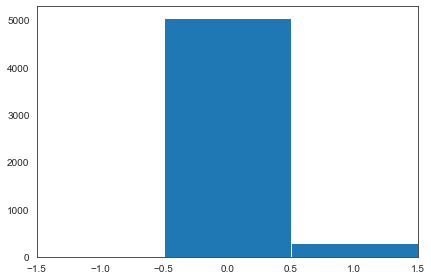

In [23]:
plot_cluster_distribution(result_sc)

## Compare Spectral Clustering with Input Data

In [24]:
result_sc = output_addNan(result_sc, nan_list)

### Adjusted Rand Index

Using calculateAri() to calculate adjusted rand index for two cluster results.

In [25]:
ari_k = calculateAri(result_sc, input_label)
print("Adjusted Rand Index of spectral clustering is ", ari_k)

Adjusted Rand Index of spectral clustering is  0.21208422075560554


### Adjusted Mutual Information

Using calculateAmi() to calculate adjusted mutual information for two cluster results.

In [26]:
ami_k = calculateAmi(result_sc, input_label)
print("Adjusted Mutual Information of spectral clustering is ", ami_k)

Adjusted Mutual Information of spectral clustering is  0.4393143677153816


### V-measure

Using calculateVm() to calculate V-measure for two cluster results.

In [27]:
vm_k = calculateVm(result_sc, input_label)
print("V-measure of spectral clustering is ", vm_k)

V-measure of spectral clustering is  0.43975669498716624


## Testing with Various Input Parameters

Testing with different sets of characteristics.

Dataset has 8 characteristics called Vp, Vs, Density, Vp/Vs, Qp, Qs, x, z, and the index of them is 0, 1, 2, 3, 4, 5, 6, 7.

In [28]:
testData1 = data_preprocessing[:,[0,1,3]]
testData2 = data_preprocessing[:,[0,2,4]]
testData3 = data_preprocessing[:,[0,1]]

- testData1 selects Vp, Vs and Vp/Vs.
- testData2 selects Vp, Density and Qp.
- testData3 selectes Vp and Vs.

## Vp, Vs, Vp/Vs

### SpectralClustering

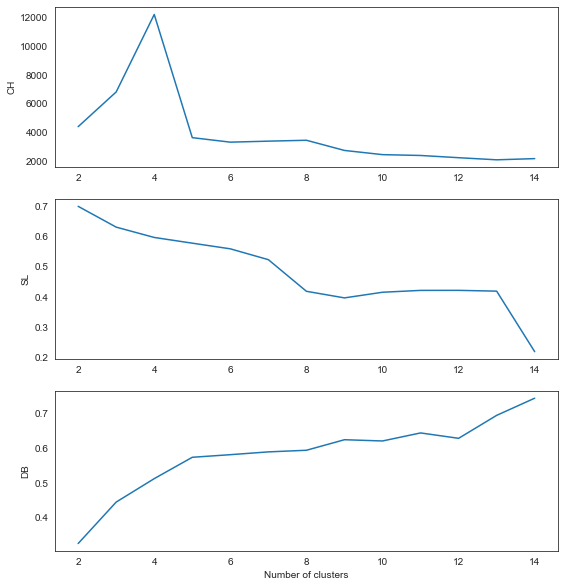

In [29]:
sc_param(testData1)

## Validation

### Calinsky-Harabasz score

In [30]:
sc_param_ch(testData1)

{'the best number of cluster': 4 }


In [31]:
result_sc = spectral(4, testData1)
result_sc = output_addNan(result_sc,nan_list)
calculatef1(result_sc, input_data)

F1-score is:  0.08166666666666667


### Silhouette score

In [32]:
sc_param_sc(testData1)

{'the best number of cluster': 2 }


In [33]:
result_sc = spectral(2, testData1)
result_sc = output_addNan(result_sc,nan_list)
calculatef1(result_sc, input_data)

F1-score is:  0.03966666666666667


### Davies Bouldin score

In [34]:
sc_param_db(testData1)

{'the best number of cluster': 2 }


In [35]:
result_sc = spectral(2, data_preprocessing[:,:-2])
result_sc = output_addNan(result_sc,nan_list)
calculatef1(result_sc, input_data)

F1-score is:  0.04533333333333334


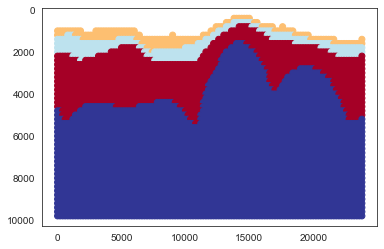

In [36]:
result_sc = spectral(4, testData1)
plotResult(data_noNan,result_sc)

## Compare Spectral Clustering with Input Data

In [37]:
result_sc = output_addNan(result_sc, nan_list)

### Adjusted Rand Index

Using calculateAri() to calculate adjusted rand index for two cluster results.

In [38]:
ari_k = calculateAri(result_sc, input_label)
print("Adjusted Rand Index of spectral clustering is ", ari_k)

Adjusted Rand Index of spectral clustering is  0.536035270648729


### Adjusted Mutual Information

Using calculateAmi() to calculate adjusted mutual information for two cluster results.

In [39]:
ami_k = calculateAmi(result_sc, input_label)
print("Adjusted Mutual Information of spectral clustering is ", ami_k)

Adjusted Mutual Information of spectral clustering is  0.6666294171053196


### V-measure

Using calculateVm() to calculate V-measure for two cluster results.

In [40]:
vm_k = calculateVm(result_sc, input_label)
print("V-measure of spectral clustering is ", vm_k)

V-measure of spectral clustering is  0.6670398542416566


## Vp, Density, Qp

### SpectralClustering

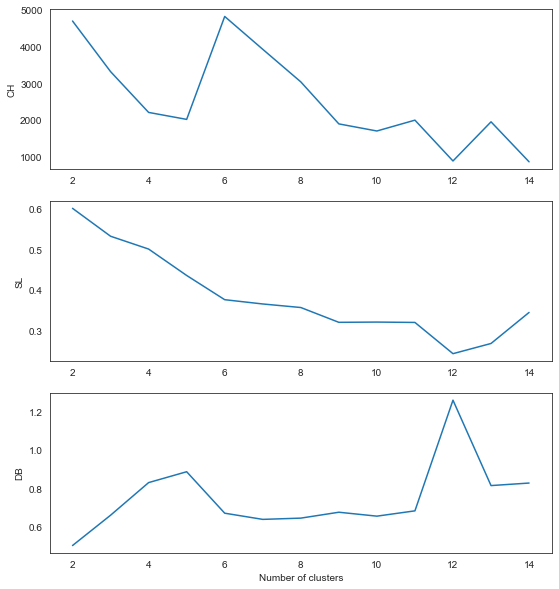

In [41]:
sc_param(testData2)

## Validation

### Calinsky-Harabasz score

In [42]:
sc_param_ch(testData2)

{'the best number of cluster': 6 }


In [43]:
result_sc = spectral(6, testData2)
result_sc = output_addNan(result_sc,nan_list)
calculatef1(result_sc, input_data)

F1-score is:  0.023833333333333335


### Silhouette score

In [44]:
sc_param_sc(testData2)

{'the best number of cluster': 2 }


In [45]:
result_sc = spectral(2, testData2)
result_sc = output_addNan(result_sc,nan_list)
calculatef1(result_sc, input_data)

F1-score is:  0.0715


### Davies Bouldin score

In [46]:
sc_param_db(testData2)

{'the best number of cluster': 2 }


In [47]:
result_sc = spectral(2, testData2)
result_sc = output_addNan(result_sc,nan_list)
calculatef1(result_sc, input_data)

F1-score is:  0.0715


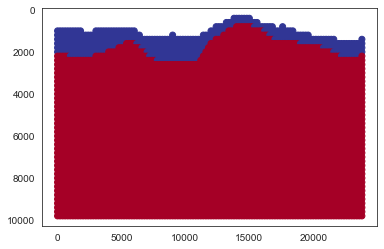

In [48]:
result_sc = spectral(2, testData2)
plotResult(data_noNan,result_sc)

## Compare Spectral Clustering with Input Data

In [49]:
result_sc = output_addNan(result_sc, nan_list)

### Adjusted Rand Index

Using calculateAri() to calculate adjusted rand index for two cluster results.

In [50]:
ari_k = calculateAri(result_sc, input_label)
print("Adjusted Rand Index of spectral clustering is ", ari_k)

Adjusted Rand Index of spectral clustering is  0.2644961937020899


### Adjusted Mutual Information

Using calculateAmi() to calculate adjusted mutual information for two cluster results.

In [51]:
ami_k = calculateAmi(result_sc, input_label)
print("Adjusted Mutual Information of spectral clustering is ", ami_k)

Adjusted Mutual Information of spectral clustering is  0.5044737329720618


### V-measure

Using calculateVm() to calculate V-measure for two cluster results.

In [52]:
vm_k = calculateVm(result_sc, input_label)
print("V-measure of spectral clustering is ", vm_k)

V-measure of spectral clustering is  0.5048497789339706


## Vp, Vs

### Spectral Clustering

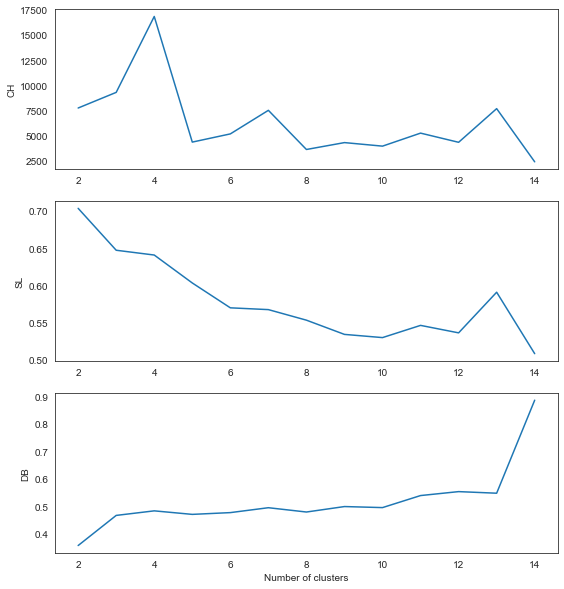

In [53]:
sc_param(testData3)

## Validation

### Calinsky-Harabasz score

In [54]:
sc_param_ch(testData3)

{'the best number of cluster': 4 }


In [55]:
result_sc = spectral(4, testData3)
result_sc = output_addNan(result_sc,nan_list)
calculatef1(result_sc, input_data)

F1-score is:  0.07883333333333334


### Silhouette score

In [56]:
sc_param_sc(testData3)

{'the best number of cluster': 2 }


In [57]:
result_sc = spectral(2, testData3)
result_sc = output_addNan(result_sc,nan_list)
calculatef1(result_sc, input_data)

F1-score is:  0.0655


### Davies Bouldin score

In [58]:
sc_param_db(testData3)

{'the best number of cluster': 2 }


In [59]:
result_sc = spectral(2, testData3)
result_sc = output_addNan(result_sc,nan_list)
calculatef1(result_sc, input_data)

F1-score is:  0.0655


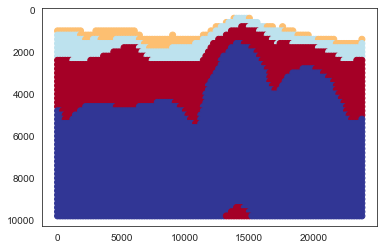

In [60]:
result_sc = spectral(4, testData3)
plotResult(data_noNan,result_sc)

## Compare Spectral Clustering with Input Data

In [61]:
result_sc = output_addNan(result_sc, nan_list)

### Adjusted Rand Index

Using calculateAri() to calculate adjusted rand index for two cluster results.

In [62]:
ari_k = calculateAri(result_sc, input_label)
print("Adjusted Rand Index of spectral clustering is ", ari_k)

Adjusted Rand Index of spectral clustering is  0.5297087010320912


### Adjusted Mutual Information

Using calculateAmi() to calculate adjusted mutual information for two cluster results.

In [63]:
ami_k = calculateAmi(result_sc, input_label)
print("Adjusted Mutual Information of spectral clusteringis ", ami_k)

Adjusted Mutual Information of spectral clusteringis  0.6606736768136415


### V-measure

Using calculateVm() to calculate V-measure for two cluster results.

In [64]:
vm_k = calculateVm(result_sc, input_label)
print("V-measure of spectral clustering is ", vm_k)

V-measure of spectral clustering is  0.6610908539414921
